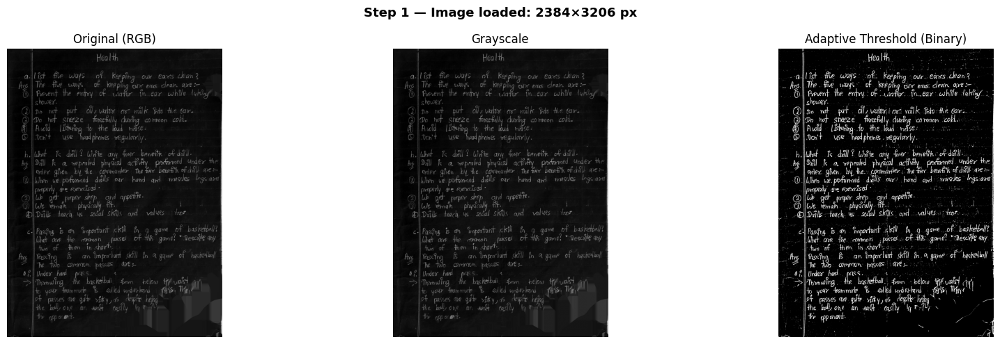

Image size : 2384 × 3206 px
Ink pixels : 681,196  (8.9% of image)


In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os, json

# ── CONFIG — update IMAGE_PATH to your file ──────────────────────────────
IMAGE_PATH = "pp/bin.png"   # <-- change this to your image path
OUTPUT_DIR = "output"
os.makedirs(OUTPUT_DIR, exist_ok=True)

PATCH_SIZE = 16    # ViT token size in pixels
LINE_T     = 20.0  # row projection threshold for line detection
COL_T      = 15.0  # column projection threshold for char detection
MERGE_K    = 3     # smoothing kernel width
MIN_CHAR_W = 10     # minimum character width (px)
MIN_CHAR_H = 17    # minimum character height (px)
PADDING    = 3     # padding around each crop (px)
# ─────────────────────────────────────────────────────────────────────────

img_bgr = cv2.imread(IMAGE_PATH)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
gray    = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
H, W    = gray.shape

binary = cv2.adaptiveThreshold(
    gray, 255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY, 31, -5
)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
axes[0].imshow(img_rgb);         axes[0].set_title("Original (RGB)",       fontsize=12); axes[0].axis('off')
axes[1].imshow(gray, cmap='gray'); axes[1].set_title("Grayscale",           fontsize=12); axes[1].axis('off')
axes[2].imshow(binary, cmap='gray'); axes[2].set_title("Adaptive Threshold (Binary)", fontsize=12); axes[2].axis('off')
plt.suptitle(f"Step 1 — Image loaded: {W}×{H} px", fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

print(f"Image size : {W} × {H} px")
print(f"Ink pixels : {(binary==255).sum():,}  ({(binary==255).mean()*100:.1f}% of image)")


Patch grid   : 149 cols × 201 rows
Total tokens : 29949
Score range  : 0.000 – 0.812
Mean score   : 0.089


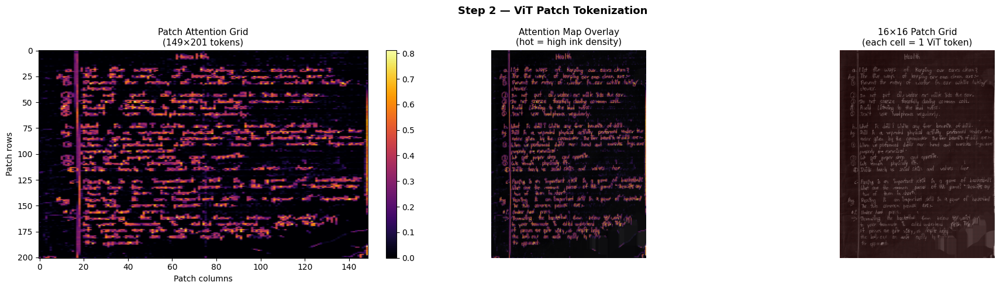

Loading google/vit-base-patch16-224 ...


Loading weights: 100%|██████████| 198/198 [00:00<00:00, 2919.46it/s]
ViTModel LOAD REPORT from: google/vit-base-patch16-224
Key               | Status     |  | 
------------------+------------+--+-
classifier.bias   | UNEXPECTED |  | 
classifier.weight | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


ViT ready.
Patch grid   : 14 cols × 14 rows
Total tokens : 196
Score range  : 0.000 – 1.000
Mean score   : 0.214


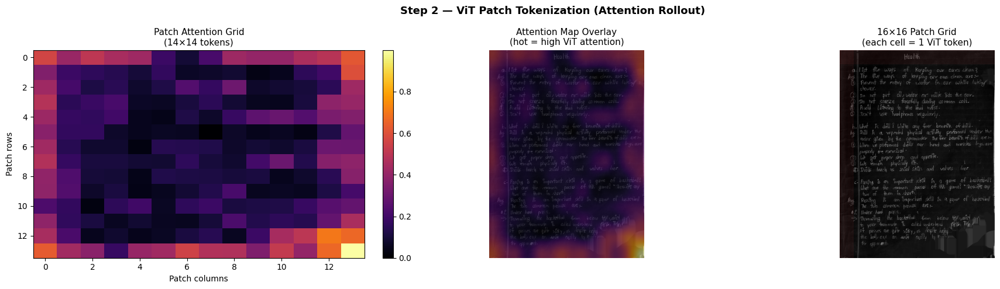

In [11]:
# ── Step 2 — ViT Patch Tokenization + Attention Score Map ─────────────────
from transformers import ViTModel, ViTImageProcessor
import torch

VIT_MODEL_NAME = "google/vit-base-patch16-224"

print(f"Loading {VIT_MODEL_NAME} ...")
vit_processor = ViTImageProcessor.from_pretrained(VIT_MODEL_NAME)
vit_model     = ViTModel.from_pretrained(VIT_MODEL_NAME,
                                          output_attentions=True,
                                          add_pooling_layer=False)
vit_model.eval()
print("ViT ready.")

# ── Compute patch_scores (same shape & meaning as before) ─────────────────
img_pil = Image.fromarray(img_rgb)
inputs  = vit_processor(images=img_pil, return_tensors="pt")

with torch.no_grad():
    outputs = vit_model(**inputs, output_attentions=True)

# Attention rollout across all 12 layers
num_tokens = outputs.attentions[0].shape[-1]          # 197 (1 CLS + 196 patches)
rollout    = torch.eye(num_tokens)

for attn_layer in outputs.attentions:
    attn_avg  = attn_layer[0].mean(dim=0)             # avg heads → [197, 197]
    attn_avg  = attn_avg + torch.eye(num_tokens)      # residual
    attn_avg  = attn_avg / attn_avg.sum(dim=-1, keepdim=True)
    rollout   = attn_avg @ rollout

cls_attn   = rollout[0, 1:].numpy()                   # CLS→patches: [196]
grid_size  = int(cls_attn.shape[0] ** 0.5)            # 14
patch_scores = cls_attn.reshape(grid_size, grid_size) # [14, 14]  ← same var name
patch_scores = (patch_scores - patch_scores.min()) / \
               (patch_scores.max() - patch_scores.min() + 1e-8)
patch_scores = patch_scores.astype(np.float32)

ph, pw = patch_scores.shape                           # 14, 14

# Upsample to full image resolution (same var name as before)
attention_map = cv2.resize(patch_scores, (W, H), interpolation=cv2.INTER_CUBIC)

print(f"Patch grid   : {pw} cols × {ph} rows")
print(f"Total tokens : {pw * ph}")
print(f"Score range  : {patch_scores.min():.3f} – {patch_scores.max():.3f}")
print(f"Mean score   : {patch_scores.mean():.3f}")

# ── Visualisation (identical layout to original cell) ─────────────────────
fig, axes = plt.subplots(1, 3, figsize=(19, 5))

axes[0].imshow(patch_scores, cmap='inferno', aspect='auto')
axes[0].set_title(f"Patch Attention Grid\n({pw}×{ph} tokens)", fontsize=11)
axes[0].set_xlabel("Patch columns"); axes[0].set_ylabel("Patch rows")
plt.colorbar(axes[0].images[0], ax=axes[0], fraction=0.046)

axes[1].imshow(img_rgb)
axes[1].imshow(attention_map, cmap='inferno', alpha=0.55)
axes[1].set_title("Attention Map Overlay\n(hot = high ViT attention)", fontsize=11)
axes[1].axis('off')

grid_vis = img_rgb.copy()
for r in range(ph): cv2.line(grid_vis, (0, r*PATCH_SIZE), (W, r*PATCH_SIZE), (255,80,80), 1)
for c in range(pw): cv2.line(grid_vis, (c*PATCH_SIZE, 0), (c*PATCH_SIZE, H), (255,80,80), 1)
axes[2].imshow(grid_vis)
axes[2].set_title(f"16×16 Patch Grid\n(each cell = 1 ViT token)", fontsize=11)
axes[2].axis('off')

plt.suptitle("Step 2 — ViT Patch Tokenization (Attention Rollout)", fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

Text lines detected: 25
  Line 1: rows 279–336  (57px tall)
  Line 2: rows 383–439  (56px tall)
  Line 3: rows 477–531  (54px tall)
  Line 4: rows 671–724  (53px tall)
  Line 5: rows 764–821  (57px tall)
  Line 6: rows 866–917  (51px tall)
  Line 7: rows 967–1013  (46px tall)
  Line 8: rows 1131–1205  (74px tall)
  Line 9: rows 1229–1303  (74px tall)
  Line 10: rows 1322–1396  (74px tall)
  Line 11: rows 1426–1493  (67px tall)
  Line 12: rows 1547–1588  (41px tall)
  Line 13: rows 1633–1685  (52px tall)
  Line 14: rows 1729–1778  (49px tall)
  Line 15: rows 1802–1871  (69px tall)
  Line 16: rows 1989–2058  (69px tall)
  Line 17: rows 2075–2151  (76px tall)
  Line 18: rows 2204–2235  (31px tall)
  Line 19: rows 2271–2338  (67px tall)
  Line 20: rows 2380–2427  (47px tall)
  Line 21: rows 2486–2525  (39px tall)
  Line 22: rows 2566–2625  (59px tall)
  Line 23: rows 2665–2715  (50px tall)
  Line 24: rows 2765–2818  (53px tall)
  Line 25: rows 2864–2909  (45px tall)


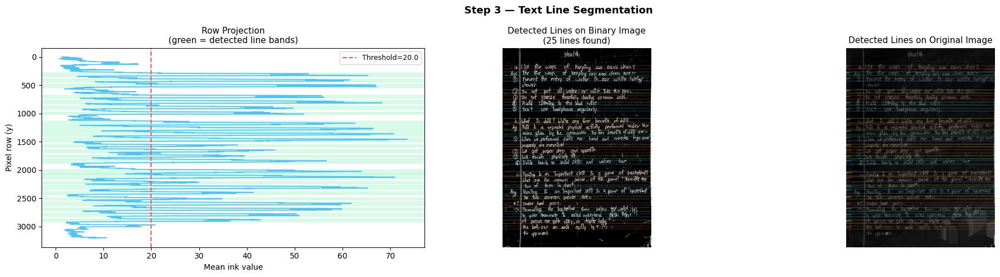

In [ ]:
pixel_row = binary.mean(axis=1)   # mean ink value per pixel row  (shape: H,)

# Detect line bands
in_line = False
line_bands = []
start = 0
for y in range(H):
    if not in_line and pixel_row[y] > LINE_T:
        in_line = True;  start = y
    elif in_line and pixel_row[y] <= LINE_T:
        in_line = False
        if (y - start) > MIN_CHAR_H:
            line_bands.append((max(0, start-2), min(H, y+2)))
if in_line:
    line_bands.append((max(0, start-2), H))

print(f"Text lines detected: {len(line_bands)}")
for i, (a, b) in enumerate(line_bands):
    print(f"  Line {i+1}: rows {a}–{b}  ({b-a}px tall)")

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# Row projection curve
axes[0].plot(pixel_row, np.arange(H), color='#4fc3f7', linewidth=1.2)
axes[0].axvline(LINE_T, color='#ff5252', linestyle='--', label=f'Threshold={LINE_T}')
for (a, b) in line_bands:
    axes[0].axhspan(a, b, alpha=0.25, color='#69f0ae')
axes[0].invert_yaxis()
axes[0].set_xlabel("Mean ink value"); axes[0].set_ylabel("Pixel row (y)")
axes[0].set_title("Row Projection\n(green = detected line bands)", fontsize=11)
axes[0].legend(fontsize=9)

# Line bands overlaid on binary
vis_bin = cv2.cvtColor(binary, cv2.COLOR_GRAY2RGB)
colors_lines = [(255,80,80),(80,255,130),(80,180,255),(255,220,50)]
for i, (a, b) in enumerate(line_bands):
    col = colors_lines[i % len(colors_lines)]
    cv2.rectangle(vis_bin, (0, a), (W-1, b), col, 2)
axes[1].imshow(vis_bin)
axes[1].set_title(f"Detected Lines on Binary Image\n({len(line_bands)} lines found)", fontsize=11)
axes[1].axis('off')

# Line bands on original
vis_orig = img_rgb.copy()
for i, (a, b) in enumerate(line_bands):
    col = colors_lines[i % len(colors_lines)]
    cv2.rectangle(vis_orig, (0, a), (W-1, b), col, 2)
    cv2.putText(vis_orig, f"Line {i+1}", (5, a+20),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, col, 2)
axes[2].imshow(vis_orig)
axes[2].set_title("Detected Lines on Original Image", fontsize=11)
axes[2].axis('off')

plt.suptitle("Step 3 — Text Line Segmentation", fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()


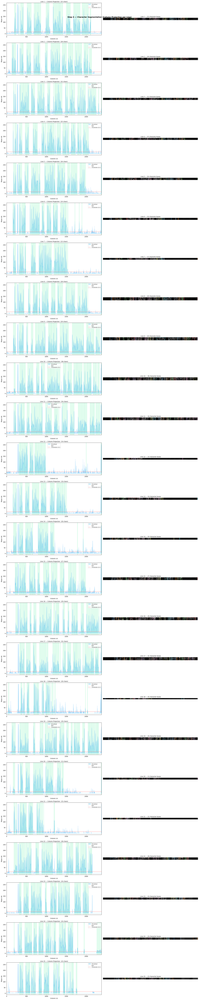


Total characters found: 629


In [13]:
kernel    = np.ones(MERGE_K) / MERGE_K
all_chars = []   # (line_idx, char_idx, x0, y0, x1, y1)

fig, axes_grid = plt.subplots(len(line_bands), 2, figsize=(20, 4*len(line_bands)))
if len(line_bands) == 1:
    axes_grid = [axes_grid]

for li, (y0, y1) in enumerate(line_bands):
    line_bin   = binary[y0:y1, :]
    col_proj   = line_bin.mean(axis=0)                          # raw projection
    col_smooth = np.convolve(col_proj, kernel, mode='same')     # smoothed
    ink_mask   = col_smooth > COL_T

    # Find connected ink runs (= characters)
    in_char  = False
    cx_start = 0
    chars_this = []
    for x in range(W):
        if not in_char and ink_mask[x]:
            in_char = True;  cx_start = x
        elif in_char and not ink_mask[x]:
            in_char = False
            if (x - cx_start) >= MIN_CHAR_W:
                chars_this.append((cx_start, x))
    if in_char and (W - cx_start) >= MIN_CHAR_W:
        chars_this.append((cx_start, W))

    for ci, (x0c, x1c) in enumerate(chars_this):
        all_chars.append((li, ci, x0c, y0, x1c, y1))

    # ── Plot column projection ──
    ax_proj = axes_grid[li][0]
    ax_proj.fill_between(range(W), col_smooth, alpha=0.4, color='#4fc3f7', label='Smoothed')
    ax_proj.plot(col_proj, color='#90caf9', linewidth=0.8, alpha=0.6, label='Raw')
    ax_proj.axhline(COL_T, color='#ff5252', linestyle='--', linewidth=1.2, label=f'Threshold={COL_T}')
    for (x0c, x1c) in chars_this:
        ax_proj.axvspan(x0c, x1c, alpha=0.2, color='#69f0ae')
    ax_proj.set_title(f"Line {li+1} — Column Projection  ({len(chars_this)} chars)", fontsize=10)
    ax_proj.set_xlabel("Column (x)"); ax_proj.set_ylabel("Mean ink")
    ax_proj.legend(fontsize=8); ax_proj.set_xlim(0, W)

    # ── Plot bounding boxes on line crop ──
    ax_vis = axes_grid[li][1]
    line_vis = img_rgb[y0:y1, :].copy()
    cmap20 = plt.cm.tab20.colors
    for ci, (x0c, x1c) in enumerate(chars_this):
        col = tuple(int(v*255) for v in cmap20[ci % len(cmap20)][:3])
        cv2.rectangle(line_vis, (x0c, 0), (x1c, y1-y0), col, 2)
    ax_vis.imshow(line_vis)
    ax_vis.set_title(f"Line {li+1} — {len(chars_this)} character boxes", fontsize=10)
    ax_vis.axis('off')

plt.suptitle("Step 4 — Character Segmentation (Column Projection per Line)",
             fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()
print(f"\nTotal characters found: {len(all_chars)}")


In [ ]:
metadata = []
for (li, ci, x0c, y0c, x1c, y1c) in all_chars:
    px0 = max(0, x0c - PADDING);  px1 = min(W, x1c + PADDING)
    py0 = max(0, y0c - PADDING);  py1 = min(H, y1c + PADDING)
    crop  = img_rgb[py0:py1, px0:px1]
    fname = f"line{li+1:02d}_char{ci+1:03d}.png"
    fpath = os.path.join(OUTPUT_DIR, fname)
    Image.fromarray(crop).save(fpath)
    metadata.append({
        "file": fname, "line": li+1, "char": ci+1,
        "bbox": [int(x0c), int(y0c), int(x1c), int(y1c)]
    })

with open(os.path.join(OUTPUT_DIR, "metadata.json"), "w") as f:
    json.dump(metadata, f, indent=2)

print(f"Saved {len(all_chars)} character crops → '{OUTPUT_DIR}/'")
print(f"metadata.json written\n")

# Print a summary table
print(f"{'File':<28}  {'Line':>4}  {'Char':>4}  {'BBox (x0,y0,x1,y1)'}")
print("-" * 65)
for m in metadata[:15]:
    bb = m['bbox']
    print(f"{m['file']:<28}  {m['line']:>4}  {m['char']:>4}  {bb}")
if len(metadata) > 15:
    print(f"... and {len(metadata)-15} more")


✅ Saved 629 character crops → 'output/'
📄 metadata.json written

File                          Line  Char  BBox (x0,y0,x1,y1)
-----------------------------------------------------------------
line01_char001.png               1     1  [193, 279, 234, 336]
line01_char002.png               1     2  [301, 279, 314, 336]
line01_char003.png               1     3  [344, 279, 427, 336]
line01_char004.png               1     4  [511, 279, 621, 336]
line01_char005.png               1     5  [687, 279, 727, 336]
line01_char006.png               1     6  [729, 279, 788, 336]
line01_char007.png               1     7  [792, 279, 820, 336]
line01_char008.png               1     8  [827, 279, 861, 336]
line01_char009.png               1     9  [987, 279, 1023, 336]
line01_char010.png               1    10  [1027, 279, 1071, 336]
line01_char011.png               1    11  [1166, 279, 1267, 336]
line01_char012.png               1    12  [1273, 279, 1307, 336]
line01_char013.png               1    13  [13

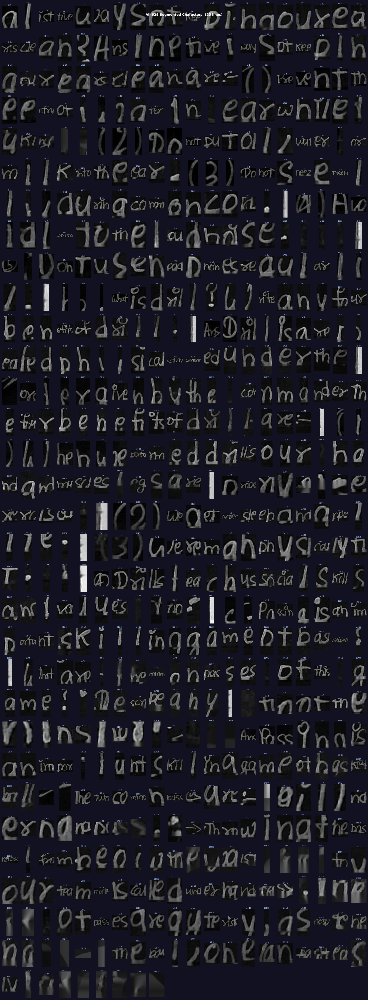

In [15]:
# ── Contact sheet ──────────────────────────────────────────────────────
n     = len(all_chars)
ncols = min(20, n)
nrows = (n + ncols - 1) // ncols

fig, axes2 = plt.subplots(nrows, ncols, figsize=(ncols*1.0, nrows*1.7))
fig.patch.set_facecolor('#111122')
fig.suptitle(f"All {n} Segmented Characters  ({len(line_bands)} lines)",
             fontsize=13, fontweight='bold', color='white')
axes2_flat = np.array(axes2).flatten()

for i, (li, ci, x0c, y0c, x1c, y1c) in enumerate(all_chars):
    crop = img_rgb[y0c:y1c, x0c:x1c]
    axes2_flat[i].imshow(crop)
    axes2_flat[i].set_title(f"L{li+1}·{ci+1}", fontsize=6, color='#aaccff', pad=1)
    axes2_flat[i].axis('off')

for j in range(n, len(axes2_flat)):
    axes2_flat[j].axis('off')

plt.tight_layout()
plt.show()


Patch grid   : 149 cols × 201 rows
Total tokens : 29949
Score range  : 0.000 – 0.812
Mean score   : 0.089


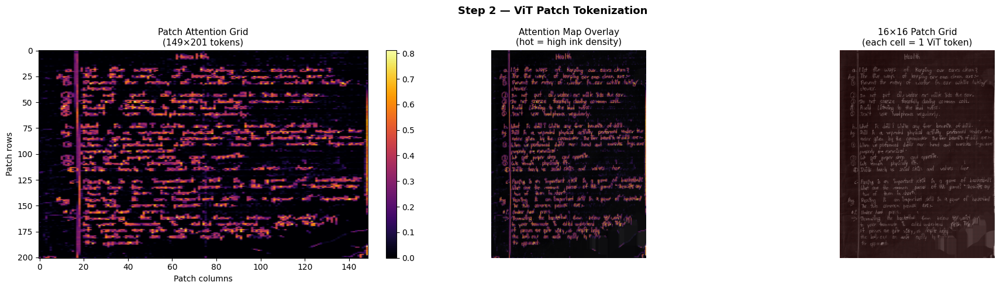

In [17]:
ph = (H + PATCH_SIZE - 1) // PATCH_SIZE   # patch rows
pw = (W + PATCH_SIZE - 1) // PATCH_SIZE   # patch cols

patch_scores = np.zeros((ph, pw), dtype=np.float32)

for r in range(ph):
    for c in range(pw):
        y0p = r * PATCH_SIZE;  y1p = min((r+1)*PATCH_SIZE, H)
        x0p = c * PATCH_SIZE;  x1p = min((c+1)*PATCH_SIZE, W)
        patch = binary[y0p:y1p, x0p:x1p]
        patch_scores[r, c] = patch.mean() / 255.0   # ink density → attention score

# Upsample attention map to full image resolution
attention_map = cv2.resize(patch_scores, (W, H), interpolation=cv2.INTER_NEAREST)

print(f"Patch grid   : {pw} cols × {ph} rows")
print(f"Total tokens : {pw * ph}")
print(f"Score range  : {patch_scores.min():.3f} – {patch_scores.max():.3f}")
print(f"Mean score   : {patch_scores.mean():.3f}")

fig, axes = plt.subplots(1, 3, figsize=(19, 5))

axes[0].imshow(patch_scores, cmap='inferno', aspect='auto')
axes[0].set_title(f"Patch Attention Grid\n({pw}×{ph} tokens)", fontsize=11)
axes[0].set_xlabel("Patch columns"); axes[0].set_ylabel("Patch rows")
plt.colorbar(axes[0].images[0], ax=axes[0], fraction=0.046)

axes[1].imshow(img_rgb)
axes[1].imshow(attention_map, cmap='inferno', alpha=0.55)
axes[1].set_title("Attention Map Overlay\n(hot = high ink density)", fontsize=11)
axes[1].axis('off')

# Show patch grid lines on original
grid_vis = img_rgb.copy()
for r in range(ph): cv2.line(grid_vis, (0, r*PATCH_SIZE), (W, r*PATCH_SIZE), (255,80,80), 1)
for c in range(pw): cv2.line(grid_vis, (c*PATCH_SIZE, 0), (c*PATCH_SIZE, H), (255,80,80), 1)
axes[2].imshow(grid_vis)
axes[2].set_title(f"16×16 Patch Grid\n(each cell = 1 ViT token)", fontsize=11)
axes[2].axis('off')

plt.suptitle("Step 2 — ViT Patch Tokenization", fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()


Text lines detected: 25
  Line 1: rows 279–336  (57px tall)
  Line 2: rows 383–439  (56px tall)
  Line 3: rows 477–531  (54px tall)
  Line 4: rows 671–724  (53px tall)
  Line 5: rows 764–821  (57px tall)
  Line 6: rows 866–917  (51px tall)
  Line 7: rows 967–1013  (46px tall)
  Line 8: rows 1131–1205  (74px tall)
  Line 9: rows 1229–1303  (74px tall)
  Line 10: rows 1322–1396  (74px tall)
  Line 11: rows 1426–1493  (67px tall)
  Line 12: rows 1547–1588  (41px tall)
  Line 13: rows 1633–1685  (52px tall)
  Line 14: rows 1729–1778  (49px tall)
  Line 15: rows 1802–1871  (69px tall)
  Line 16: rows 1989–2058  (69px tall)
  Line 17: rows 2075–2151  (76px tall)
  Line 18: rows 2204–2235  (31px tall)
  Line 19: rows 2271–2338  (67px tall)
  Line 20: rows 2380–2427  (47px tall)
  Line 21: rows 2486–2525  (39px tall)
  Line 22: rows 2566–2625  (59px tall)
  Line 23: rows 2665–2715  (50px tall)
  Line 24: rows 2765–2818  (53px tall)
  Line 25: rows 2864–2909  (45px tall)


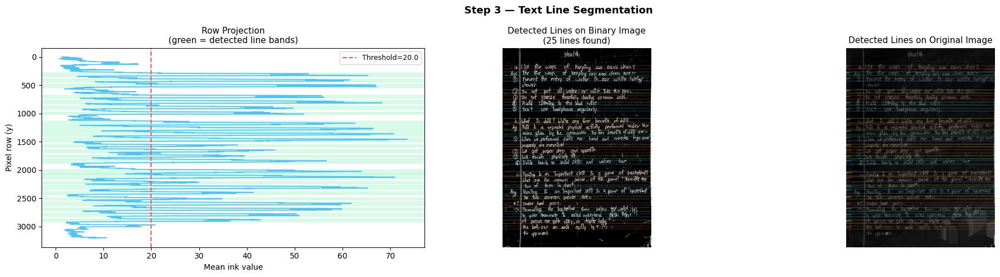

In [18]:
pixel_row = binary.mean(axis=1)   # mean ink value per pixel row  (shape: H,)

# Detect line bands
in_line = False
line_bands = []
start = 0
for y in range(H):
    if not in_line and pixel_row[y] > LINE_T:
        in_line = True;  start = y
    elif in_line and pixel_row[y] <= LINE_T:
        in_line = False
        if (y - start) > MIN_CHAR_H:
            line_bands.append((max(0, start-2), min(H, y+2)))
if in_line:
    line_bands.append((max(0, start-2), H))

print(f"Text lines detected: {len(line_bands)}")
for i, (a, b) in enumerate(line_bands):
    print(f"  Line {i+1}: rows {a}–{b}  ({b-a}px tall)")

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# Row projection curve
axes[0].plot(pixel_row, np.arange(H), color='#4fc3f7', linewidth=1.2)
axes[0].axvline(LINE_T, color='#ff5252', linestyle='--', label=f'Threshold={LINE_T}')
for (a, b) in line_bands:
    axes[0].axhspan(a, b, alpha=0.25, color='#69f0ae')
axes[0].invert_yaxis()
axes[0].set_xlabel("Mean ink value"); axes[0].set_ylabel("Pixel row (y)")
axes[0].set_title("Row Projection\n(green = detected line bands)", fontsize=11)
axes[0].legend(fontsize=9)

# Line bands overlaid on binary
vis_bin = cv2.cvtColor(binary, cv2.COLOR_GRAY2RGB)
colors_lines = [(255,80,80),(80,255,130),(80,180,255),(255,220,50)]
for i, (a, b) in enumerate(line_bands):
    col = colors_lines[i % len(colors_lines)]
    cv2.rectangle(vis_bin, (0, a), (W-1, b), col, 2)
axes[1].imshow(vis_bin)
axes[1].set_title(f"Detected Lines on Binary Image\n({len(line_bands)} lines found)", fontsize=11)
axes[1].axis('off')

# Line bands on original
vis_orig = img_rgb.copy()
for i, (a, b) in enumerate(line_bands):
    col = colors_lines[i % len(colors_lines)]
    cv2.rectangle(vis_orig, (0, a), (W-1, b), col, 2)
    cv2.putText(vis_orig, f"Line {i+1}", (5, a+20),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, col, 2)
axes[2].imshow(vis_orig)
axes[2].set_title("Detected Lines on Original Image", fontsize=11)
axes[2].axis('off')

plt.suptitle("Step 3 — Text Line Segmentation", fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()


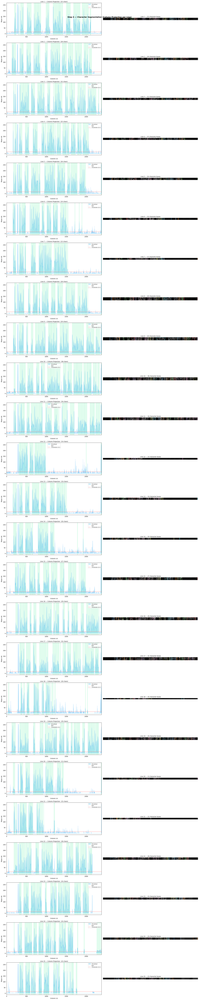


Total characters found: 629


In [19]:
kernel    = np.ones(MERGE_K) / MERGE_K
all_chars = []   # (line_idx, char_idx, x0, y0, x1, y1)

fig, axes_grid = plt.subplots(len(line_bands), 2, figsize=(20, 4*len(line_bands)))
if len(line_bands) == 1:
    axes_grid = [axes_grid]

for li, (y0, y1) in enumerate(line_bands):
    line_bin   = binary[y0:y1, :]
    col_proj   = line_bin.mean(axis=0)                          # raw projection
    col_smooth = np.convolve(col_proj, kernel, mode='same')     # smoothed
    ink_mask   = col_smooth > COL_T

    # Find connected ink runs (= characters)
    in_char  = False
    cx_start = 0
    chars_this = []
    for x in range(W):
        if not in_char and ink_mask[x]:
            in_char = True;  cx_start = x
        elif in_char and not ink_mask[x]:
            in_char = False
            if (x - cx_start) >= MIN_CHAR_W:
                chars_this.append((cx_start, x))
    if in_char and (W - cx_start) >= MIN_CHAR_W:
        chars_this.append((cx_start, W))

    for ci, (x0c, x1c) in enumerate(chars_this):
        all_chars.append((li, ci, x0c, y0, x1c, y1))

    # ── Plot column projection ──
    ax_proj = axes_grid[li][0]
    ax_proj.fill_between(range(W), col_smooth, alpha=0.4, color='#4fc3f7', label='Smoothed')
    ax_proj.plot(col_proj, color='#90caf9', linewidth=0.8, alpha=0.6, label='Raw')
    ax_proj.axhline(COL_T, color='#ff5252', linestyle='--', linewidth=1.2, label=f'Threshold={COL_T}')
    for (x0c, x1c) in chars_this:
        ax_proj.axvspan(x0c, x1c, alpha=0.2, color='#69f0ae')
    ax_proj.set_title(f"Line {li+1} — Column Projection  ({len(chars_this)} chars)", fontsize=10)
    ax_proj.set_xlabel("Column (x)"); ax_proj.set_ylabel("Mean ink")
    ax_proj.legend(fontsize=8); ax_proj.set_xlim(0, W)

    # ── Plot bounding boxes on line crop ──
    ax_vis = axes_grid[li][1]
    line_vis = img_rgb[y0:y1, :].copy()
    cmap20 = plt.cm.tab20.colors
    for ci, (x0c, x1c) in enumerate(chars_this):
        col = tuple(int(v*255) for v in cmap20[ci % len(cmap20)][:3])
        cv2.rectangle(line_vis, (x0c, 0), (x1c, y1-y0), col, 2)
    ax_vis.imshow(line_vis)
    ax_vis.set_title(f"Line {li+1} — {len(chars_this)} character boxes", fontsize=10)
    ax_vis.axis('off')

plt.suptitle("Step 4 — Character Segmentation (Column Projection per Line)",
             fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()
print(f"\nTotal characters found: {len(all_chars)}")


In [22]:
metadata = []
for (li, ci, x0c, y0c, x1c, y1c) in all_chars:
    px0 = max(0, x0c - PADDING);  px1 = min(W, x1c + PADDING)
    py0 = max(0, y0c - PADDING);  py1 = min(H, y1c + PADDING)
    crop  = img_rgb[py0:py1, px0:px1]
    fname = f"IDline{li+1:02d}_char{ci+1:03d}.png"
    fpath = os.path.join(OUTPUT_DIR, fname)
    Image.fromarray(crop).save(fpath)
    metadata.append({
        "file": fname, "line": li+1, "char": ci+1,
        "bbox": [int(x0c), int(y0c), int(x1c), int(y1c)]
    })

with open(os.path.join(OUTPUT_DIR, "metadata.json"), "w") as f:
    json.dump(metadata, f, indent=2)

print(f"Saved {len(all_chars)} character crops → '{OUTPUT_DIR}/'")
print(f"metadata.json written\n")

# Print a summary table
print(f"{'File':<28}  {'Line':>4}  {'Char':>4}  {'BBox (x0,y0,x1,y1)'}")
print("-" * 65)
for m in metadata[:15]:
    bb = m['bbox']
    print(f"{m['file']:<28}  {m['line']:>4}  {m['char']:>4}  {bb}")
if len(metadata) > 15:
    print(f"... and {len(metadata)-15} more")


Saved 629 character crops → 'output/'
metadata.json written

File                          Line  Char  BBox (x0,y0,x1,y1)
-----------------------------------------------------------------
IDline01_char001.png             1     1  [193, 279, 234, 336]
IDline01_char002.png             1     2  [301, 279, 314, 336]
IDline01_char003.png             1     3  [344, 279, 427, 336]
IDline01_char004.png             1     4  [511, 279, 621, 336]
IDline01_char005.png             1     5  [687, 279, 727, 336]
IDline01_char006.png             1     6  [729, 279, 788, 336]
IDline01_char007.png             1     7  [792, 279, 820, 336]
IDline01_char008.png             1     8  [827, 279, 861, 336]
IDline01_char009.png             1     9  [987, 279, 1023, 336]
IDline01_char010.png             1    10  [1027, 279, 1071, 336]
IDline01_char011.png             1    11  [1166, 279, 1267, 336]
IDline01_char012.png             1    12  [1273, 279, 1307, 336]
IDline01_char013.png             1    13  [1311, 

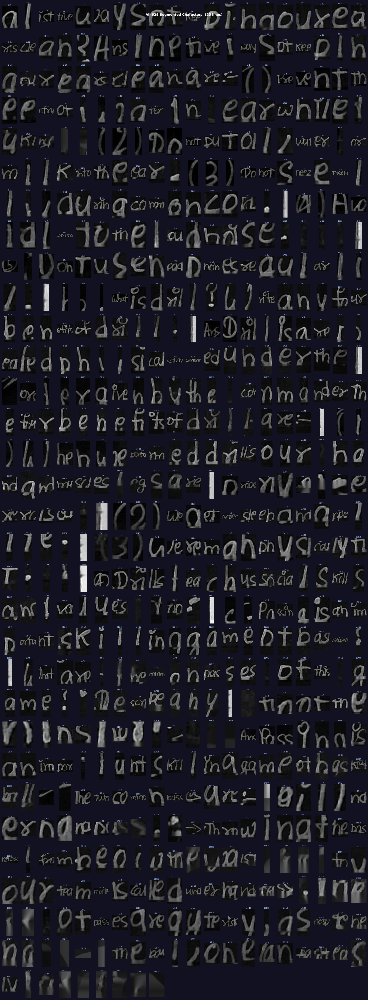

In [23]:
# ── Contact sheet ──────────────────────────────────────────────────────
n     = len(all_chars)
ncols = min(20, n)
nrows = (n + ncols - 1) // ncols

fig, axes2 = plt.subplots(nrows, ncols, figsize=(ncols*1.0, nrows*1.7))
fig.patch.set_facecolor('#111122')
fig.suptitle(f"All {n} Segmented Characters  ({len(line_bands)} lines)",
             fontsize=13, fontweight='bold', color='white')
axes2_flat = np.array(axes2).flatten()

for i, (li, ci, x0c, y0c, x1c, y1c) in enumerate(all_chars):
    crop = img_rgb[y0c:y1c, x0c:x1c]
    axes2_flat[i].imshow(crop)
    axes2_flat[i].set_title(f"L{li+1}·{ci+1}", fontsize=6, color='#aaccff', pad=1)
    axes2_flat[i].axis('off')

for j in range(n, len(axes2_flat)):
    axes2_flat[j].axis('off')

plt.tight_layout()
plt.show()
